# Downsize Segment-Anything (SAM) model with OFM
In this tutorial, we will show you how to quickly extract a downsized model from SAM-huge by OFM. The downsized model is more efficient with siginificantly reduced parameters and FLOPs.

Due to the lack of benchmark datasets of segment-anything tasks, we will use some image samples from SA1B dataset to demonstrate the effectiveness of the downsized model. 

First, let's import dependencies.

In [1]:
import os
import random
import json
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw
from pycocotools import mask as coco_mask
from transformers import SamModel, SamProcessor, pipeline
from ofm import OFM
import torch
import gc
import torch
from PIL import Image
import requests
import torchvision.transforms as transforms


from torch.nn import Parameter
def calculate_params(model):
    """calculate the number of parameters in the model
    Args:
        model: the model to be evaluated
    Returns:
        total_params: the number of parameters in the model
        percentage: the percentage of trainable parameters in the model
    """

    millions = 1000000
    total_params = 0
    for name, module in model.named_modules():
        if hasattr(module, "weight") and isinstance(module.weight, Parameter):
            total_params += torch.prod(torch.tensor(module.weight.size())).item()

    return total_params / millions


The history saving thread hit an unexpected error (OperationalError('unable to open database file')).History will not be written to the database.


Matplotlib created a temporary cache directory at /scratch/yusx/1313691/matplotlib-b67zo6mo because the default path (/home/yusx/.cache/matplotlib) is not a writable directory; it is highly recommended to set the MPLCONFIGDIR environment variable to a writable directory, in particular to speed up the import of Matplotlib and to better support multiprocessing.
/work/LAS/jannesar-lab/sixing/.conda/envs/ofm/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Then, we load Sam-Huge from Huggingface model hub.



In [2]:

# Initialize the original SAM model and processor
original_model = SamModel.from_pretrained("facebook/sam-vit-huge").to("cuda")
processor = SamProcessor.from_pretrained("facebook/sam-vit-huge")



config.json: 100%|██████████| 6.57k/6.57k [00:00<00:00, 45.0MB/s]
model.safetensors: 100%|██████████| 2.56G/2.56G [00:23<00:00, 107MB/s] 
preprocessor_config.json: 100%|██████████| 466/466 [00:00<00:00, 2.48MB/s]


Next, we convert the SAM model to a supernet via OFM supernet class.
To extract a downsized model from the supernet, we can simply call the `resource_aware_model` API. There are multiple ways to get a downsized models, such as specifying the target model structure, get smallest size model with a elastic space, or get a random downsized model. More details can be found in the `examples/post_training_deployment`.

In this example, we extract the smallest model with a elastic space.



In [3]:
# OFM configuration and submodel initialization
elastic_config = {
    "atten_out_space": [1280],
    "inter_hidden_space": [2048],
    "residual_hidden_space": [2048],
}
supernet = OFM(original_model, elastic_config=elastic_config)
submodel, params, config = supernet.random_resource_aware_model()



Let's compare the model size between the original model and the downsized model.

In [4]:
original_model_params = calculate_params(original_model)
ds_model_params = calculate_params(submodel)
print(f"Original model has {original_model_params}M parameters")
print(f"Downsized model has {ds_model_params}M parameters")
print(f"Total model size reduction: {original_model_params - ds_model_params}M")

Original model has 635.177828M parameters
Downsized model has 383.519588M parameters
Total model size reduction: 251.65823999999998M


To make comparision with downsized model and original model, we now initialize the inference pipelein

In [ ]:

# Initialize the mask generation pipeline for the original SAM model
original_generator = pipeline("mask-generation", model=original_model, device="cuda", image_processor=processor.image_processor)

submodel_generator = pipeline("mask-generation", model=submodel, device="cuda", image_processor=processor.image_processor)


Run the segment task on the original model and the downsized model, and compare the results.

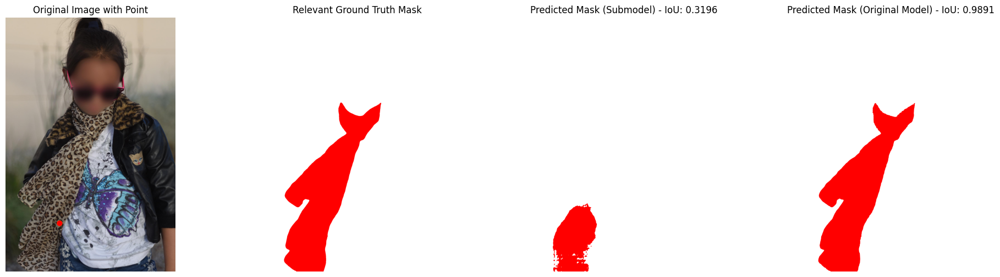

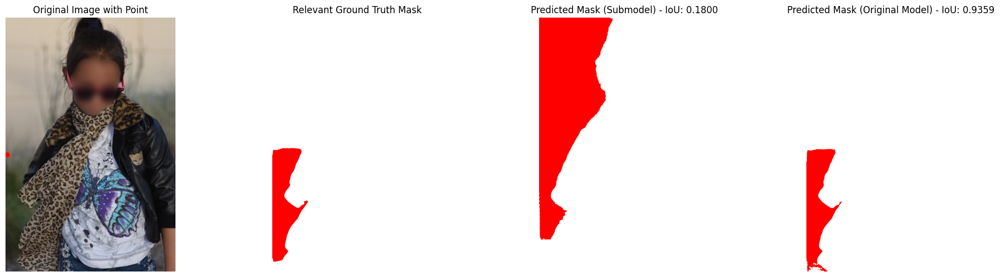

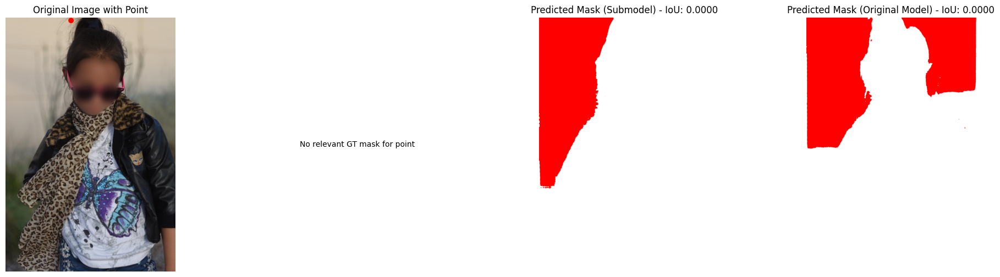

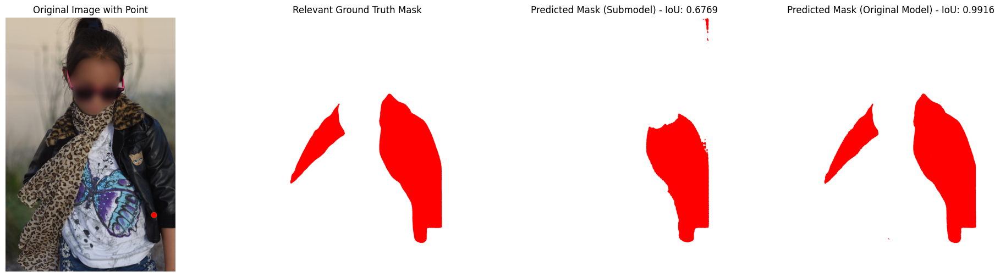

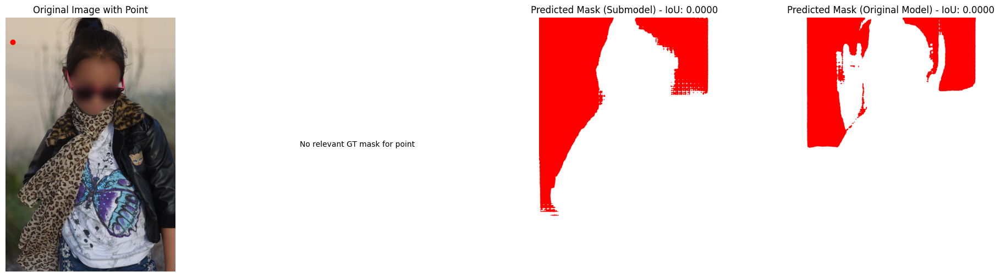

...

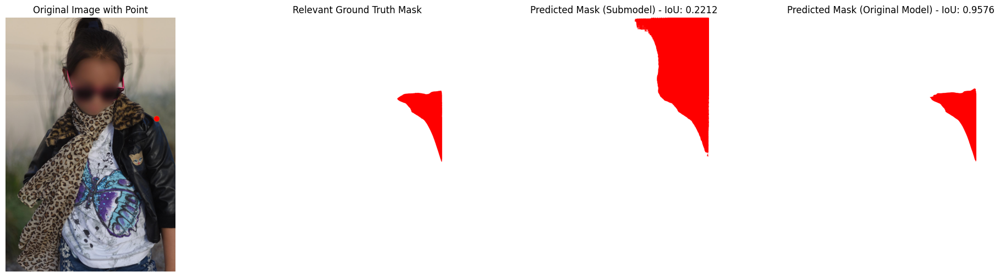

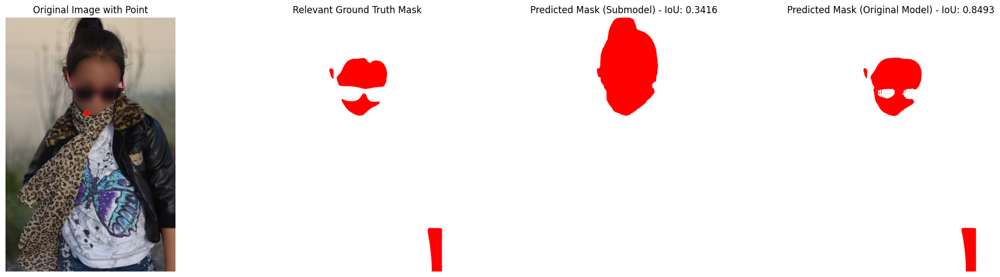

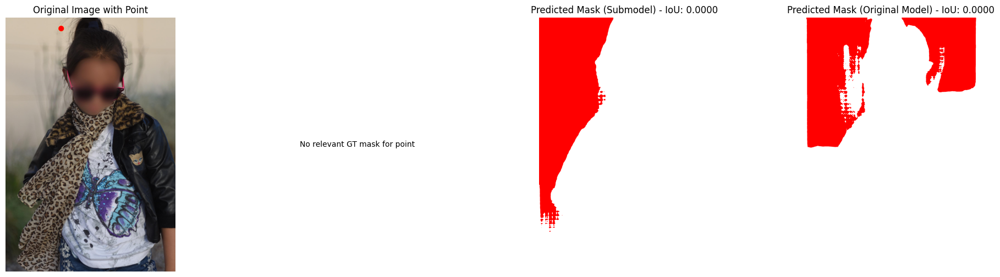

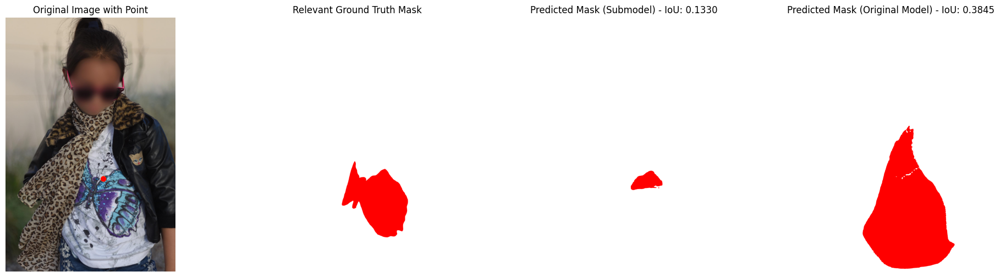

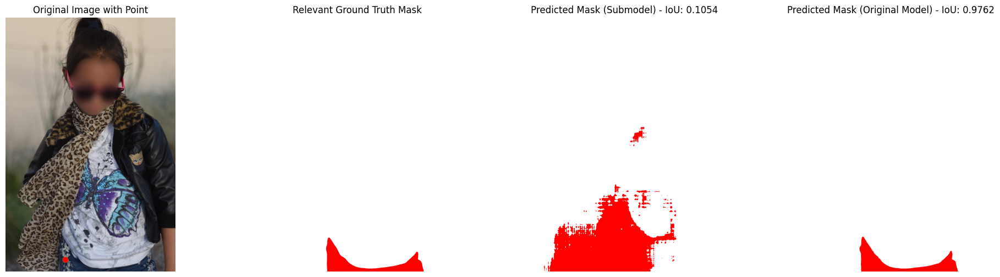

In [3]:

models = {"submodel": submodel, "original_model": original_model}





def get_image_info(dataset_directory, num_images=1):
    image_mask_pairs = []
    for filename in os.listdir(dataset_directory):
        if filename.endswith(".jpg"):
            image_path = os.path.join(dataset_directory, filename)
            mask_filename = filename.replace(".jpg", ".json")
            mask_path = os.path.join(dataset_directory, mask_filename)
            if os.path.exists(mask_path):
                image_mask_pairs.append((image_path, mask_path))
    selected_pairs = random.sample(image_mask_pairs, min(num_images, len(image_mask_pairs)))
    return selected_pairs

def get_ground_truth_masks(mask_path):
    binary_masks = []
    with open(mask_path, 'r') as json_file:
        mask_data = json.load(json_file)
    for annotation in mask_data['annotations']:
        rle_mask = annotation['segmentation']
        binary_mask = coco_mask.decode(rle_mask)
        binary_masks.append(binary_mask)
    return binary_masks

def calculate_metrics(pred_mask, gt_mask):
    intersection = np.logical_and(pred_mask, gt_mask).sum()
    union = np.logical_or(pred_mask, gt_mask).sum()
    iou = intersection / union if union != 0 else 0
    return iou

def show_mask_on_white_background(mask, ax):
    if mask is not None:
        h, w = mask.shape
        white_background = np.ones((h, w, 3), dtype=np.uint8) * 255
        mask_image = mask.reshape(h, w, 1) * np.array([255, 0, 0], dtype=np.uint8).reshape(1, 1, 3)
        white_background[mask_image[:, :, 0] > 0] = mask_image[mask_image[:, :, 0] > 0]
        ax.imshow(white_background)
    else:
        ax.text(0.5, 0.5, 'No mask detected', horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)
    ax.set_xticks([])
    ax.set_yticks([])

def point_in_mask(point, mask):
    x, y = point
    if mask[y, x] > 0:
        return True
    return False


dataset_directory = "SA1B"
selected_images = get_image_info(dataset_directory)




for image_path, mask_path in selected_images:
    original_image = Image.open(image_path).convert("RGB")
    ground_truth_masks = get_ground_truth_masks(mask_path)

    for _ in range(20):  # Process 20 random points
        image_for_display = original_image.copy()
        draw = ImageDraw.Draw(image_for_display)
        raw_image = np.array(original_image)
        # print("Raw image shape1", raw_image.shape)
        input_point = [random.randint(0, raw_image.shape[1]-1), random.randint(0, raw_image.shape[0]-1)]
        #input_point = [259, 500]  # 2D location of a window in the image

        draw.ellipse((input_point[0]-25, input_point[1]-25, input_point[0]+25, input_point[1]+25), fill='red', outline='yellow')


        relevant_gt_mask = None
        for gt_mask in ground_truth_masks:
            if point_in_mask(input_point, gt_mask):
                relevant_gt_mask = gt_mask
                break
        input_points = [[input_point]]
                
        inputs = processor(raw_image, input_points=input_points, return_tensors="pt").to("cuda")
        
        transform = transforms.ToTensor()
        image_tensor = transform(raw_image)
        with torch.no_grad():
            submodel_outputs = models["submodel"](**inputs)
            submodel_masks = processor.image_processor.post_process_masks(
                submodel_outputs.pred_masks.cpu(), inputs["original_sizes"].cpu(), inputs["reshaped_input_sizes"].cpu()
             )
            
        with torch.no_grad():
            original_outputs = models["original_model"](**inputs)
            
            model_masks = processor.image_processor.post_process_masks(
                original_outputs.pred_masks.cpu(), inputs["original_sizes"].cpu(), inputs["reshaped_input_sizes"].cpu()
            )
            

        
        submodel_predicted_mask = submodel_masks[0].squeeze(0).squeeze(0).cpu()[1] if submodel_masks else None
        original_predicted_mask = model_masks[0].squeeze(0).squeeze(0).cpu()[1] if model_masks else None



        iou_submodel = calculate_metrics(submodel_predicted_mask, relevant_gt_mask) if relevant_gt_mask is not None and submodel_predicted_mask is not None else 0
        iou_original = calculate_metrics(original_predicted_mask, relevant_gt_mask) if relevant_gt_mask is not None and original_predicted_mask is not None else 0

        plt.figure(figsize=(24, 6))
        plt.subplot(1, 4, 1)
        plt.imshow(image_for_display)
        plt.title('Original Image with Point')
        plt.axis('off')

        plt.subplot(1, 4, 2)
        if relevant_gt_mask is not None:
            show_mask_on_white_background(relevant_gt_mask, plt.gca())
            plt.title('Relevant Ground Truth Mask')
        else:
            plt.text(0.5, 0.5, 'No relevant GT mask for point', horizontalalignment='center', verticalalignment='center', transform=plt.gca().transAxes)
        plt.axis('off')

        plt.subplot(1, 4, 3)
        if submodel_predicted_mask is not None:
            show_mask_on_white_background(submodel_predicted_mask, plt.gca())
            plt.title(f'Predicted Mask (Submodel) - IoU: {iou_submodel:.4f}')
        else:
            plt.text(0.5, 0.5, 'Submodel detected no mask', horizontalalignment='center', verticalalignment='center', transform=plt.gca().transAxes)
        plt.axis('off')

        plt.subplot(1, 4, 4)
        if original_predicted_mask is not None:
            show_mask_on_white_background(original_predicted_mask, plt.gca())
            plt.title(f'Predicted Mask (Original Model) - IoU: {iou_original:.4f}')
        else:
            plt.text(0.5, 0.5, 'Original Model detected no mask', horizontalalignment='center', verticalalignment='center', transform=plt.gca().transAxes)
        plt.axis('off')

        plt.show()


This part is for more than 1 image, also all random points has relevent ground truth mask

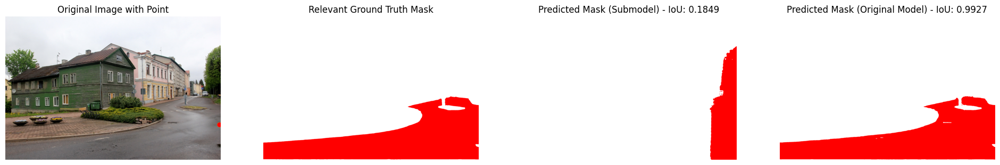

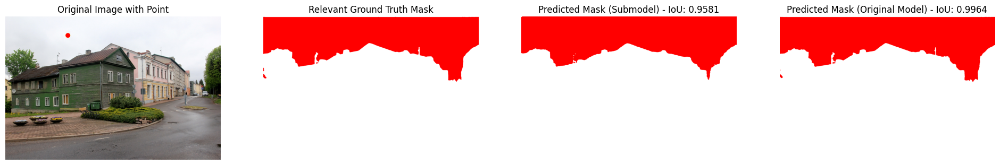

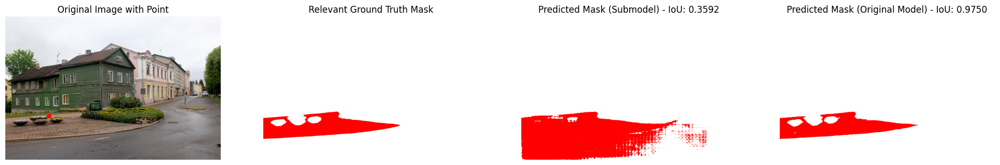

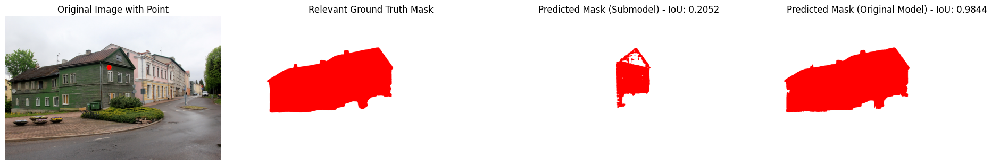

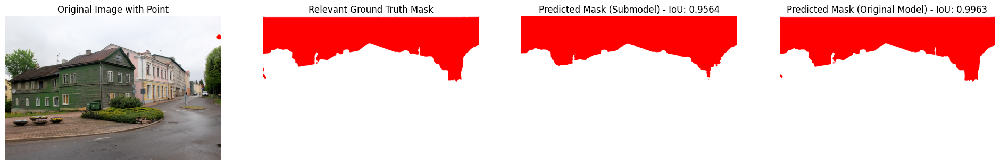

...

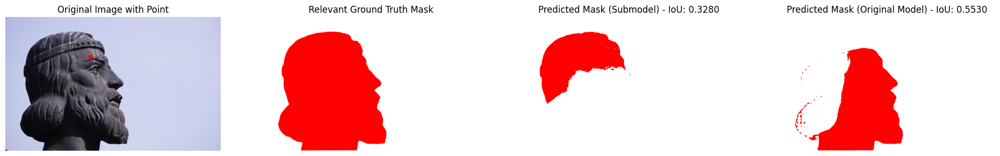

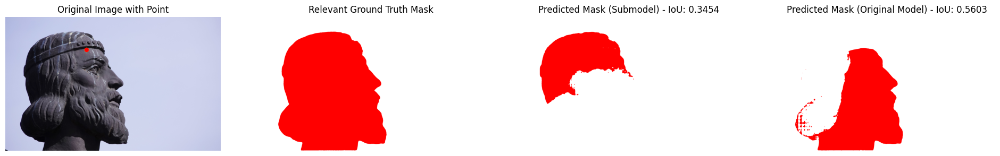

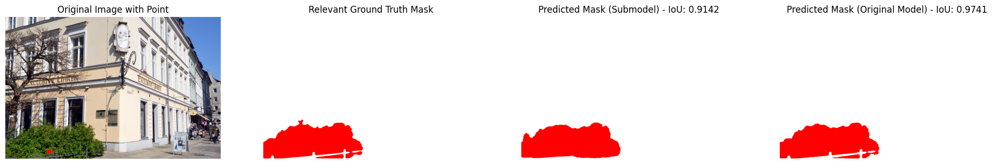

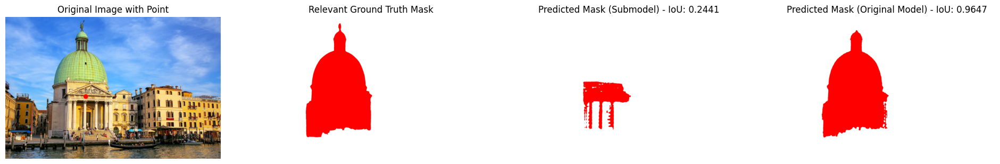

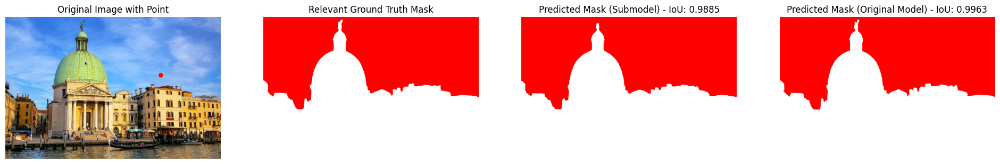

In [1]:
import os
import random
import json
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw
from pycocotools import mask as coco_mask
from transformers import SamModel, SamProcessor, pipeline
from ofm import OFM
import torch
import gc
import torch
from PIL import Image
import requests
import torchvision.transforms as transforms


# Initialize the original SAM model and processor
original_model = SamModel.from_pretrained("facebook/sam-vit-huge").to("cuda")
processor = SamProcessor.from_pretrained("facebook/sam-vit-huge")

# Initialize the mask generation pipeline for the original SAM model
original_generator = pipeline("mask-generation", model=original_model, device="cuda", image_processor=processor.image_processor)

elastic_config = {
    "atten_out_space": [1280],
    "inter_hidden_space": [2048],
    "residual_hidden_space": [2048],
}
supernet = OFM(original_model, elastic_config=elastic_config)
submodel, params, config = supernet.random_resource_aware_model()
submodel_generator = pipeline("mask-generation", model=submodel, device="cuda", image_processor=processor.image_processor)

models = {"submodel": submodel, "original_model": original_model}






def get_image_info(dataset_directory, num_images=1):
    image_mask_pairs = []
    for filename in os.listdir(dataset_directory):
        if filename.endswith(".jpg"):
            image_path = os.path.join(dataset_directory, filename)
            mask_filename = filename.replace(".jpg", ".json")
            mask_path = os.path.join(dataset_directory, mask_filename)
            if os.path.exists(mask_path):
                image_mask_pairs.append((image_path, mask_path))
    selected_pairs = random.sample(image_mask_pairs, min(num_images, len(image_mask_pairs)))
    return selected_pairs

def get_ground_truth_masks(mask_path):
    binary_masks = []
    with open(mask_path, 'r') as json_file:
        mask_data = json.load(json_file)
    for annotation in mask_data['annotations']:
        rle_mask = annotation['segmentation']
        binary_mask = coco_mask.decode(rle_mask)
        binary_masks.append(binary_mask)
    return binary_masks

def calculate_metrics(pred_mask, gt_mask):
    intersection = np.logical_and(pred_mask, gt_mask).sum()
    union = np.logical_or(pred_mask, gt_mask).sum()
    iou = intersection / union if union != 0 else 0
    return iou

def show_mask_on_white_background(mask, ax):
    if mask is not None:
        h, w = mask.shape
        white_background = np.ones((h, w, 3), dtype=np.uint8) * 255
        mask_image = mask.reshape(h, w, 1) * np.array([255, 0, 0], dtype=np.uint8).reshape(1, 1, 3)
        white_background[mask_image[:, :, 0] > 0] = mask_image[mask_image[:, :, 0] > 0]
        ax.imshow(white_background)
    else:
        ax.text(0.5, 0.5, 'No mask detected', horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)
    ax.set_xticks([])
    ax.set_yticks([])

def valid_points_from_masks(gt_masks):
    points = []
    for mask in gt_masks:
        ys, xs = np.where(mask > 0)
        points += [(x, y) for x, y in zip(xs, ys)]
    return points
  

def point_in_mask(point, mask):
    x, y = point
    return mask[y, x] > 0



dataset_directory = "SA1B"
selected_images = get_image_info(dataset_directory, num_images=5)

# Process each selected image and its corresponding mask
for image_path, mask_path in selected_images:
    original_image = Image.open(image_path).convert("RGB")
    ground_truth_masks = get_ground_truth_masks(mask_path)
    
    
    for _ in range(5):  # Process 20 random points
        
        image_for_display = original_image.copy()
        draw = ImageDraw.Draw(image_for_display)
        raw_image = np.array(original_image)
        # print("Raw image shape1", raw_image.shape)
        input_point = [random.randint(0, raw_image.shape[1]-1), random.randint(0, raw_image.shape[0]-1)]
        #input_point = [259, 500]  # 2D location of a window in the image

        draw.ellipse((input_point[0]-25, input_point[1]-25, input_point[0]+25, input_point[1]+25), fill='red', outline='yellow')


        relevant_gt_mask = next((mask for mask in ground_truth_masks if point_in_mask(input_point, mask)), None)
        if relevant_gt_mask is None:
            continue  # This check is redundant but included for clarity
        
        input_points = [[input_point]]
                
        inputs = processor(raw_image, input_points=input_points, return_tensors="pt").to("cuda")
        
        transform = transforms.ToTensor()
        # Apply the transformations to the image
        image_tensor = transform(raw_image)
        # # Print the shape of the torch tensor
        # print("Raw image shape", image_tensor.shape)
        # print("input points",input_points )
        with torch.no_grad():
            submodel_outputs = models["submodel"](**inputs)
            submodel_masks = processor.image_processor.post_process_masks(
                submodel_outputs.pred_masks.cpu(), inputs["original_sizes"].cpu(), inputs["reshaped_input_sizes"].cpu()
             )
            
        with torch.no_grad():
            original_outputs = models["original_model"](**inputs)
            
            model_masks = processor.image_processor.post_process_masks(
                original_outputs.pred_masks.cpu(), inputs["original_sizes"].cpu(), inputs["reshaped_input_sizes"].cpu()
            )

        submodel_predicted_mask = submodel_masks[0].squeeze(0).squeeze(0).cpu()[1] if submodel_masks else None
        original_predicted_mask = model_masks[0].squeeze(0).squeeze(0).cpu()[1] if model_masks else None



        iou_submodel = calculate_metrics(submodel_predicted_mask, relevant_gt_mask) if relevant_gt_mask is not None and submodel_predicted_mask is not None else 0
        iou_original = calculate_metrics(original_predicted_mask, relevant_gt_mask) if relevant_gt_mask is not None and original_predicted_mask is not None else 0

        plt.figure(figsize=(24, 6))
        plt.subplot(1, 4, 1)
        plt.imshow(image_for_display)
        plt.title('Original Image with Point')
        plt.axis('off')

        plt.subplot(1, 4, 2)
        if relevant_gt_mask is not None:
            show_mask_on_white_background(relevant_gt_mask, plt.gca())
            plt.title('Relevant Ground Truth Mask')
        else:
            plt.text(0.5, 0.5, 'No relevant GT mask for point', horizontalalignment='center', verticalalignment='center', transform=plt.gca().transAxes)
        plt.axis('off')

        plt.subplot(1, 4, 3)
        if submodel_predicted_mask is not None:
            show_mask_on_white_background(submodel_predicted_mask, plt.gca())
            plt.title(f'Predicted Mask (Submodel) - IoU: {iou_submodel:.4f}')
        else:
            plt.text(0.5, 0.5, 'Submodel detected no mask', horizontalalignment='center', verticalalignment='center', transform=plt.gca().transAxes)
        plt.axis('off')

        plt.subplot(1, 4, 4)
        if original_predicted_mask is not None:
            show_mask_on_white_background(original_predicted_mask, plt.gca())
            plt.title(f'Predicted Mask (Original Model) - IoU: {iou_original:.4f}')
        else:
            plt.text(0.5, 0.5, 'Original Model detected no mask', horizontalalignment='center', verticalalignment='center', transform=plt.gca().transAxes)
        plt.axis('off')

        plt.show()
